In [1]:
## Useful: https://www.cloudandfree.com/en/remove_non_ascii.php
## https://www.codespeedy.com/how-to-change-figure-size-in-plotly-in-python/

In [2]:
novel_to_analyze = 'Lady_Audleys_Secret_ed3.txt'
novel_name = novel_to_analyze.split('.')[0]
print(novel_name)
## to all spreadsheets:
path_to_spreadsheets = '../../data/spreadsheets/'

Lady_Audleys_Secret_ed3


In [3]:
### Installs:
# conda install -c plotly plotly=5.7.0
# !pip install spacy
# !pip install plotly==5.7.0
# import nltk
# nltk.download('punkt')
# !python3 -m spacy download en_core_web_sm

In [4]:
import codecs
import os
import pandas as pd
# to be able to see more columns when dataframes are printed out:
# pd.set_option('display.max_columns', 100)
pd.set_option('display.max_columns', 1000,'display.max_colwidth', None, 'display.width', 1000, 'display.max_rows',1000)
# to not get copy warnings when splitting dataframes
pd.options.mode.chained_assignment = None
import re
import spacy
import sys
import numpy as np

import matplotlib.pyplot as plt
import random
from nltk.tokenize import sent_tokenize

# Vis:
# import matplotlib
# import cufflinks as cf
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
py.init_notebook_mode(connected=True)
# import plotly.offline as py
# import plotly.graph_objs as go

# cf.go_offline() # required to use plotly offline (no account required).
# py.init_notebook_mode() # graphs charts inline (IPython).

In [5]:
## to Newpaper Novel corpus:
path_to_nnovels_corpus = '../../data/corpora/corpus_newspaper_novels/' 

## to assets:
path_to_assets = '../../assets/'
## characters and numbers to exclude from texts:
exclude_file = 'characters_and_numbers_to_exclude.txt'

# characters to exclude
with codecs.open(path_to_assets + exclude_file, 'r', encoding='utf-8', errors="warn") as characters_to_exclude_raw:
    characters_to_exclude = characters_to_exclude_raw.read()
    characters_to_exclude = characters_to_exclude.split()

print(characters_to_exclude)
characters_to_exclude_edited = ['<', '*', '-', ']', '~', ',', '{', '$', '+', '[', '|', '_', '@', '(', '%', '^', '/', '\\\\', '&', '#', '>', '}', '=', ')']

['<', '*', '-', ']', '~', ',', '{', '$', '+', '[', '"', '|', '_', '@', '(', "'", '%', '^', '/', '\\\\', '&', '#', '>', '}', '`', '=', ')', '”', '“', '‘', '’', '3', '6', '2', '1', '5', '7', '4', '8', '9', '0']


In [6]:
with codecs.open(path_to_nnovels_corpus + novel_to_analyze, 'r', encoding='utf-8', errors="warn") as raw_text:
    dirty_text = raw_text.read()

In [7]:


prefixes = "(Mr|St|Mrs|Ms|Dr)[.]"
dashes = "(--)+"


dirty_text = re.sub(prefixes,"\\1<prd>", dirty_text)
dirty_text = re.sub(dashes, ' \\1 ', dirty_text)
dirty_text = re.sub('(“|”)', '"', dirty_text)
clean_text_list = sent_tokenize(dirty_text)

clean_sentences = []
for sent in clean_text_list:
    # res.append(re.sub('\n', '', sent))
    # removing newline notations
    clean_sent = re.sub('\n', ' ', sent)
    clean_sent = re.sub('\r', ' ', clean_sent)
    # transforming multiple spaces to one space
    clean_sent = re.sub('\s+',' ', clean_sent)
    clean_sentences.append(clean_sent)
    


In [8]:
text_dict = {"sentences":clean_sentences}
df = pd.DataFrame.from_dict(text_dict)
df.head(10)

,sentences
0,CHAPTER I. LUCY.
1,"It lay down in a hollow, rich with fine old timber and luxuriant pastures; and you came upon it through an avenue of limes, bordered on either side by meadows, over the high hedges of which the cattle looked inquisitively at you as you passed, wondering, perhaps, what you wanted; for there was no thorough-fare, and unless you were going to the Court you had no business there at all."
2,"At the end of this avenue there was an old arch and a clock tower, with a stupid, bewildering clock, which had only one hand and which jumped straight from one hour to the next and was therefore always in extremes."
3,Through this arch you walked straight into the gardens of Audley Court.
4,"A smooth lawn lay before you, dotted with groups of rhododendrons, which grew in more perfection here than anywhere else in the county."
5,"To the right there were the kitchen gardens, the fish-pond, and an orchard bordered by a dry moat, and a broken ruin of a wall, in some places thicker than it was high, and everywhere overgrown with trailing ivy, yellow stonecrop, and dark moss."
6,"To the left there was a broad graveled walk, down which, years ago, when the place had been a convent, the quiet nuns had walked hand in hand; a wall bordered with espaliers, and shadowed on one side by goodly oaks, which shut out the flat landscape, and circled in the house and gardens with a darkening shelter."
7,"The house faced the arch, and occupied three sides of a quadrangle."
8,"It was very old, and very irregular and rambling."
9,"The windows were uneven; some small, some large, some with heavy stone mullions and rich stained glass; others with frail lattices that rattled in every breeze; others so modern that they might have been added only yesterday."


In [9]:
df['is_upper'] = 0
df['chapter_count'] = ''
counter = 0

for index, row in df.iterrows():
    text = row['sentences']
    if text.isupper():
        # print(text)
        df.at[index, 'is_upper'] = 1
    if text.startswith("CHAPTER"):
        print(text)
        counter += 1
    df.at[index, 'chapter_count'] = "chapter_"+str(counter)
df = df[df.is_upper != 1]
df = df.drop('is_upper', 1)
df['narration_is_0_dialogue_is_1'] = 0
print(len(set(df.chapter_count.values.tolist())))
df.head()


CHAPTER I. LUCY.
CHAPTER II.
CHAPTER III.
CHAPTER IV.
CHAPTER V. THE HEADSTONE AT VENTNOR.
CHAPTER VI.
CHAPTER VII.
CHAPTER VIII.
CHAPTER IX.
CHAPTER X.
CHAPTER XI.
CHAPTER XII.
CHAPTER XIII.
CHAPTER XIV.
CHAPTER XV.
CHAPTER XVI.
CHAPTER XVII.
CHAPTER XVIII.
CHAPTER XIX.
CHAPTER XX.
CHAPTER XXI.
CHAPTER XXII.
CHAPTER XXIII.
CHAPTER XXIV.
CHAPTER XXV.
CHAPTER XXVI.
CHAPTER XXVII.
CHAPTER XXVIII.
CHAPTER XXIX.
CHAPTER XXX.
CHAPTER XXXI.
CHAPTER XXXII.
CHAPTER XXXIII.
CHAPTER XXXIV.
CHAPTER XXXV.
CHAPTER XXXVI.
CHAPTER XXXVII.
CHAPTER XXXVIII.
CHAPTER XL.
CHAPTER XLI.
40


/var/folders/qc/zp281qzs35s7jg8lywg995f00000gn/T/ipykernel_94964/3948548816.py:15: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



,sentences,chapter_count,narration_is_0_dialogue_is_1
1,"It lay down in a hollow, rich with fine old timber and luxuriant pastures; and you came upon it through an avenue of limes, bordered on either side by meadows, over the high hedges of which the cattle looked inquisitively at you as you passed, wondering, perhaps, what you wanted; for there was no thorough-fare, and unless you were going to the Court you had no business there at all.",chapter_1,0
2,"At the end of this avenue there was an old arch and a clock tower, with a stupid, bewildering clock, which had only one hand and which jumped straight from one hour to the next and was therefore always in extremes.",chapter_1,0
3,Through this arch you walked straight into the gardens of Audley Court.,chapter_1,0
4,"A smooth lawn lay before you, dotted with groups of rhododendrons, which grew in more perfection here than anywhere else in the county.",chapter_1,0
5,"To the right there were the kitchen gardens, the fish-pond, and an orchard bordered by a dry moat, and a broken ruin of a wall, in some places thicker than it was high, and everywhere overgrown with trailing ivy, yellow stonecrop, and dark moss.",chapter_1,0


In [10]:
print(len(set(df.chapter_count.values.tolist())))

40


In [11]:
dialogue_started = False
for index, row in df.iterrows():
    sent = row['sentences']
    sent = ''.join(char for char in sent if char not in characters_to_exclude_edited)
    sent = sent.strip()
    df.at[index, 'sentences'] = sent
    
    # sent = row['sentences']
    if sent.startswith('"'):
        dialogue_started = True
    if dialogue_started:
        df.at[index, 'narration_is_0_dialogue_is_1'] = 1

        if sent.endswith('"'):
            dialogue_started = False
            
        else:
            continue
    else:
        df.at[index, 'narration_is_0_dialogue_is_1'] = 0


    # if index == 20:
    #     break

In [12]:
# df.head(50)

In [13]:
df.loc[50:100,:]

,sentences,chapter_count,narration_is_0_dialogue_is_1
50,He had never loved before.,chapter_1,0
51,What had been his marriage with Alicia's mother but a dull jogtrot bargain made to keep some estate in the family that would have been just as well out of it?,chapter_1,0
52,What had been his love for his first wife but a poor pitiful smoldering spark too dull to be extinguished too feeble to burn?,chapter_1,0
53,But this was love this fever this longing this restless uncertain miserable hesitation; these cruel fears that his age was an insurmountable barrier to his happiness; this sick hatred of his white beard; this frenzied wish to be young again with glistening raven hair and a slim waist such as he had twenty years before; these wakeful nights and melancholy days so gloriously brightened if he chanced to catch a glimpse of her sweet face behind the window curtains as he drove past the surgeon's house; all these signs gave token of the truth and told only too plainly that at the sober age of fiftyfive Sir Michael Audley had fallen ill of the terrible fever called love.,chapter_1,0
54,I do not think that throughout his courtship the baronet once calculated upon his wealth or his position as reasons for his success.,chapter_1,0
55,If he ever remembered these things he dismissed the thought of them with a shudder.,chapter_1,0
56,It pained him too much to believe for a moment that any one so lovely and innocent could value herself against a splendid house or a good old title.,chapter_1,0
57,No; his hope was that as her life had been most likely one of toil and dependence and as she was very young nobody exactly knew her age but she looked little more than twenty she might never have formed any attachment and that he being the first to woo her might by tender attentions by generous watchfulness by a love which should recall to her the father she had lost and by a protecting care that should make him necessary to her win her young heart and obtain from her fresh and earliest love the promise of her hand.,chapter_1,0
58,It was a very romantic daydream no doubt; but for all that it seemed in a very fair way to be realized.,chapter_1,0
59,Lucy Graham appeared by no means to dislike the baronet's attentions.,chapter_1,0


In [14]:
prd_replace = "<prd>"


for index, row in df.iterrows():
    text = row['sentences']
    text = re.sub(prd_replace,".", text)
    df.at[index, 'sentences'] = text
    

In [15]:
df.head(10)

,sentences,chapter_count,narration_is_0_dialogue_is_1
1,It lay down in a hollow rich with fine old timber and luxuriant pastures; and you came upon it through an avenue of limes bordered on either side by meadows over the high hedges of which the cattle looked inquisitively at you as you passed wondering perhaps what you wanted; for there was no thoroughfare and unless you were going to the Court you had no business there at all.,chapter_1,0
2,At the end of this avenue there was an old arch and a clock tower with a stupid bewildering clock which had only one hand and which jumped straight from one hour to the next and was therefore always in extremes.,chapter_1,0
3,Through this arch you walked straight into the gardens of Audley Court.,chapter_1,0
4,A smooth lawn lay before you dotted with groups of rhododendrons which grew in more perfection here than anywhere else in the county.,chapter_1,0
5,To the right there were the kitchen gardens the fishpond and an orchard bordered by a dry moat and a broken ruin of a wall in some places thicker than it was high and everywhere overgrown with trailing ivy yellow stonecrop and dark moss.,chapter_1,0
6,To the left there was a broad graveled walk down which years ago when the place had been a convent the quiet nuns had walked hand in hand; a wall bordered with espaliers and shadowed on one side by goodly oaks which shut out the flat landscape and circled in the house and gardens with a darkening shelter.,chapter_1,0
7,The house faced the arch and occupied three sides of a quadrangle.,chapter_1,0
8,It was very old and very irregular and rambling.,chapter_1,0
9,The windows were uneven; some small some large some with heavy stone mullions and rich stained glass; others with frail lattices that rattled in every breeze; others so modern that they might have been added only yesterday.,chapter_1,0
10,Great piles of chimneys rose up here and there behind the pointed gables and seemed as if they were so broken down by age and long service that they must have fallen but for the straggling ivy which crawling up the walls and trailing even over the roof wound itself about them and supported them.,chapter_1,0


In [16]:
df["sentence_length"] = 0
# df["location"] = 0
# location = 0
# count = 0

for index, row in df.iterrows():
    # if index % chunk_size == 0:
    #     location += 1
    # df.at[index, "location"] = location
    df.at[index, "sentence_length"] = len(row["sentences"].split())
    

In [17]:
# df.head(50)

In [18]:
## POS tagging:

def progress(count, total, status=''):
    bar_len = 60
    filled_len = int(round(bar_len * count / float(total)))
    percents = round(100.1 * count / float(total), 1)
    bar = '#' * filled_len + '-' * (bar_len - filled_len)
    sys.stdout.write('[%s] %s%s ...%s\r' % (bar, percents, '%', status))
    sys.stdout.flush() 
    
# first loading english language support
nlp = spacy.load("en_core_web_sm")

## Takes in a dataframe and clean text column (as string), and returns the df with POS tags for all the texts
## Multiple columns are created, one for each POS tag, and one that contains all POS tags (I did this to more easily
## be able to grab POS percentages afterward)
def get_POS_tags_for_text_in_df(df, text_row_to_analyze='sentences'):
    # setting up column for pos counts
    df['all_pos_counts'] = ''
    df["parts_of_speech_total_count"] = ''
    # loop through df and get all POS tags:
    for index, row in df.iterrows():
        # show progress
        progress(index, len(df.index))
        
        # grab text
        text = row[text_row_to_analyze]
        
        # this is a memory buffer, to extend max length of available ram according to the text being analyzed
        # https://datascience.stackexchange.com/questions/38745/increasing-spacy-max-nlp-limit
        nlp.max_length = len(text) + 100
        
        # disable modules not in use to save memory
        analyzed_doc = nlp(text, disable = ['ner'])
        
        # grabbing all pos counts in the text in non-human readable format
        pos_counts_in_text = analyzed_doc.count_by(spacy.attrs.IDS['POS'])
        
        # setting up list to render pos hashes in human readable format:
        human_readable_pos_count_list = []
        
        # iterating through counts to make hashes human readable:
        for pos, count in pos_counts_in_text.items():
            human_readable_tag = analyzed_doc.vocab[pos].text
            # rendering as list to input back into df
            human_readable_tag_and_count = list((human_readable_tag, count))
            human_readable_pos_count_list.append(human_readable_tag_and_count)
        # looping through the human readable counts, assigning their label to the column
        # and the count to the row for each pos tag
        for element in human_readable_pos_count_list:
            df.at[index, 'POS_' + str(element[0])+'_count'] = element[1]
        
        # placing all the pos counts for each text in the all_pos_counts column
        df.at[index, 'all_pos_counts'] = human_readable_pos_count_list
        
        
    df = df.fillna(0)
    # getting POS percentages for each POS tag in texts
    # There are much easier and more efficient ways to do this rather than looping over the entire df again but we were pressed for time...
    # TODO: integrate this loop into previous loop
    for index, row in df.iterrows():
        total = 0.0
        for name in df.columns.values.tolist():
            if name.startswith("POS_"):
                # get total POS elements count for sanity
                total += row[name]
        try:
            df.at[index, "parts_of_speech_total_count"] = int(total)
        except Exception as e:
            print(e)
        for name in df.columns.values.tolist():
            if name.startswith("POS_"):
                # assign new name for column
                new_name = "%" + name
                # get % of total POS in text
                if total != 0:
                    percentage = round((row[name] / total) * float(100), 3)
                else:
                    print(row[text_row_to_analyze])
                # if this is the first index, create the column name to avoid errors
                if index == 0:
                    df[new_name] = 0.0
                df.at[index, new_name] = percentage
    return df

In [19]:

df = get_POS_tags_for_text_in_df(df, text_row_to_analyze='sentences')
df.head(10)

,sentences,chapter_count,narration_is_0_dialogue_is_1,sentence_length,all_pos_counts,parts_of_speech_total_count,POS_PRON_count,POS_VERB_count,POS_ADP_count,POS_DET_count,POS_ADJ_count,POS_NOUN_count,POS_CCONJ_count,POS_PUNCT_count,POS_SCONJ_count,POS_ADV_count,POS_AUX_count,POS_PROPN_count,POS_NUM_count,POS_PART_count,POS_INTJ_count,POS_X_count,POS_SPACE_count,%POS_PRON_count,%POS_VERB_count,%POS_ADP_count,%POS_DET_count,%POS_ADJ_count,%POS_NOUN_count,%POS_CCONJ_count,%POS_PUNCT_count,%POS_SCONJ_count,%POS_ADV_count,%POS_AUX_count,%POS_PROPN_count,%POS_NUM_count,%POS_PART_count,%POS_INTJ_count,%POS_X_count,%POS_SPACE_count
1,It lay down in a hollow rich with fine old timber and luxuriant pastures; and you came upon it through an avenue of limes bordered on either side by meadows over the high hedges of which the cattle looked inquisitively at you as you passed wondering perhaps what you wanted; for there was no thoroughfare and unless you were going to the Court you had no business there at all.,chapter_1,0,70,"[[PRON, 11], [VERB, 10], [ADP, 11], [DET, 8], [ADJ, 6], [NOUN, 10], [CCONJ, 3], [PUNCT, 3], [SCONJ, 4], [ADV, 5], [AUX, 1], [PROPN, 1]]",73,11.0,10.0,11.0,8.0,6.0,10.0,3.0,3.0,4.0,5.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,15.068,13.699,15.068,10.959,8.219,13.699,4.110,4.110,5.479,6.849,1.370,1.370,0.000,0.0,0.0,0.0,0.0
2,At the end of this avenue there was an old arch and a clock tower with a stupid bewildering clock which had only one hand and which jumped straight from one hour to the next and was therefore always in extremes.,chapter_1,0,41,"[[ADP, 6], [DET, 6], [NOUN, 9], [PRON, 3], [VERB, 3], [ADJ, 4], [CCONJ, 3], [ADV, 4], [NUM, 2], [AUX, 1], [PUNCT, 1]]",42,3.0,3.0,6.0,6.0,4.0,9.0,3.0,1.0,0.0,4.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,7.143,7.143,14.286,14.286,9.524,21.429,7.143,2.381,0.000,9.524,2.381,0.000,4.762,0.0,0.0,0.0,0.0
3,Through this arch you walked straight into the gardens of Audley Court.,chapter_1,0,12,"[[ADP, 3], [DET, 2], [NOUN, 2], [PRON, 1], [VERB, 1], [ADV, 1], [PROPN, 2], [PUNCT, 1]]",13,1.0,1.0,3.0,2.0,0.0,2.0,0.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,7.692,7.692,23.077,15.385,0.000,15.385,0.000,7.692,0.000,7.692,0.000,15.385,0.000,0.0,0.0,0.0,0.0
4,A smooth lawn lay before you dotted with groups of rhododendrons which grew in more perfection here than anywhere else in the county.,chapter_1,0,23,"[[DET, 2], [ADJ, 2], [NOUN, 5], [VERB, 3], [SCONJ, 1], [PRON, 2], [ADP, 5], [ADV, 3], [PUNCT, 1]]",24,2.0,3.0,5.0,2.0,2.0,5.0,0.0,1.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.333,12.500,20.833,8.333,8.333,20.833,0.000,4.167,4.167,12.500,0.000,0.000,0.000,0.0,0.0,0.0,0.0
5,To the right there were the kitchen gardens the fishpond and an orchard bordered by a dry moat and a broken ruin of a wall in some places thicker than it was high and everywhere overgrown with trailing ivy yellow stonecrop and dark moss.,chapter_1,0,44,"[[ADP, 5], [DET, 8], [NOUN, 12], [PRON, 2], [VERB, 3], [CCONJ, 4], [ADJ, 7], [SCONJ, 1], [AUX, 1], [ADV, 1], [PUNCT, 1]]",45,2.0,3.0,5.0,8.0,7.0,12.0,4.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.444,6.667,11.111,17.778,15.556,26.667,8.889,2.222,2.222,2.222,2.222,0.000,0.000,0.0,0.0,0.0,0.0
6,To the left there was a broad graveled walk down which years ago when the place had been a convent the quiet nuns had walked hand in hand; a wall bordered with espaliers and shadowed on one side by goodly oaks which shut out the flat landscape and circled in the house and gardens with a darkening shelter.,chapter_1,0,58,"[[ADP, 9], [DET, 9], [NOUN, 16], [PRON, 3], [VERB, 7], [ADJ, 4], [ADV, 2], [SCONJ, 1], [AUX, 3], [PUNCT, 2], [CCONJ, 3], [NUM, 1]]",60,3.0,7.0,9.0,9.0,4.0,16.0,3.0,2.0,1.0,2.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,5.000,11.667,15.000,15.000,6.667,26.667,5.000,3.333,1.667,3.333,5.000,0.000,1.667,0.0,0.0,0.0,0.0
7,The house faced the arch and occupied three sides of a quadrangle.,chapter_1,0,12,"[[DET, 3], [NOUN, 4], [VERB, 2], [CCONJ, 1], [NUM, 1], [ADP, 1], [PUNCT, 1]]",13,0.0,2.0,1.0,3.0,0.0,4.0,1.0,1.0,0.0

In [20]:
### FUNCTIONS 2/3

## This function takes in a list of dataframes, a list of columns to visualize, and a date column (with the same name in both dataframes)
## then plots those columns over time.

def visualize_numerical_columns__over_time(dfs, list_of_columns_to_visualize, date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel'):
    # Setting lists to capture the elements for visualization
    years_list = []
    counts_list = []
    labels_list = []
    colors_list = []
    
    # lazy way to grab some relevant info to have comparison points when looking at visuals
    print_info = []
    
    # the first dataframe in the list will be "DF_0", the second "DF_1", and so on.
    # in our case, DF_0 == df_nnovels_meta and DF_1 == df_txtlab_meta
    which_df = 0
    # loops for each df in list
    for df in dfs:
        # loops for each column in list
        for column_name in list_of_columns_to_visualize:
            
            # first grouping the specific column by year
            grouped_by_year = pd.to_numeric(df[column_name]).groupby(df[date_column])
            grouped_by_year = grouped_by_year.mean().reset_index()
            
            # grabbing the array of the years 
            years = np.array(grouped_by_year[date_column].tolist())
            # grabbing the array of the column we're visualizing
            count_to_visualize = np.array(grouped_by_year[column_name].tolist())
            
            # placing these elements in a list, and grabbing a label to know which DF is which
            years_list.append(years)
            counts_list.append(count_to_visualize)
            labels_list.append("DF_"+ str(which_df) +"_"+ column_name)
            
            # getting random colors to visualize
            r = random.random()
            b = random.random()
            g = random.random()
            color = (r, g, b)
            colors_list.append(color)
            
            # lazy way to add additional info 
            print_info.append(["The AVG of " + column_name + " of DF_" + str(which_df) +" is "+ str(df[column_name].mean())])
            print_info.append(["The MIN of " + column_name + " of DF_" + str(which_df) +" is "+ str(df[column_name].min())])
            print_info.append(["The MAX of " + column_name + " of DF_" + str(which_df) +" is "+ str(df[column_name].max())])
            
        # once loop finishes, increment DF number    
        which_df += 1
        
    # setting the size of the plot
    plt.figure(figsize=(20,10))
    # looping through the labels we added (essentially each DF), and plotting the elements sequentially using the index for each of the lists created above
    for index in range(len(labels_list)):
        plt.plot(years_list[index], counts_list[index], label=labels_list[index], c=colors_list[index])
    # showing the plot    
    plt.legend(loc='upper left')
    plt.title(title)
    plt.show()
    
    # printing out supplementary info
    for info in print_info:
        print(info)
        
    return None

In [21]:
dfs = [df]


In [22]:
# visualize_numerical_columns__over_time(dfs, ['POS_NOUN_count'], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [23]:
# visualize_numerical_columns__over_time(dfs, ['POS_VERB_count'], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [24]:
# visualize_numerical_columns__over_time(dfs, ['POS_PROPN_count'], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [25]:
# visualize_numerical_columns__over_time(dfs, ['POS_PRON_count'], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [26]:
# visualize_numerical_columns__over_time(dfs, ['%POS_NOUN_count'], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [27]:
# visualize_numerical_columns__over_time(dfs, ['%POS_VERB_count'], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [28]:
# visualize_numerical_columns__over_time(dfs, ['%POS_PROPN_count'], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [29]:
# visualize_numerical_columns__over_time(dfs, ['%POS_PRON_count'], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [30]:
# grouped_by_year = pd.to_numeric(df['%POS_NOUN_count']).groupby(df['location'])
# grouped_by_year.head(10)

In [31]:
# grouped_by_year = grouped_by_year.mean().reset_index()
# grouped_by_year.head()

In [32]:
# visualize_numerical_columns__over_time(dfs, ['POS_NOUN_count','POS_VERB_count',], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [33]:
# visualize_numerical_columns__over_time(dfs, ['POS_PROPN_count','POS_PRON_count',], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [34]:
# visualize_numerical_columns__over_time(dfs, ['%POS_NOUN_count','%POS_VERB_count',], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [35]:
# visualize_numerical_columns__over_time(dfs, ['sentence_length',], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [36]:
# visualize_numerical_columns__over_time(dfs, ['%POS_PROPN_count','%POS_PRON_count',], date_column='location', graph_y_label='What are we counting?', title='SOMETHING over the novel')

In [37]:
### Divide the DF into 5 sections and understand changes that happen in those sections:

list_of_elements_to_analyze = ['%POS_NOUN_count', '%POS_DET_count', '%POS_ADP_count', '%POS_PROPN_count', '%POS_ADJ_count', '%POS_ADV_count', '%POS_PRON_count', '%POS_VERB_count', '%POS_AUX_count', 'sentence_length']
N = 3
# columns_in_df = df2.columns.values.tolist()
print(f"Printing out information for {novel_to_analyze}. The DF is split into {N} sections.")
for name in list_of_elements_to_analyze:
    # if name.startswith("%"):
    split_arrays = np.array_split(df[name], N)
    print(f"The POS tag being shown is {name}.")
    for i in range(N):
        mean_of_section = split_arrays[i].mean()
        max_of_section = split_arrays[i].max()
        min_of_section = split_arrays[i].min()
        median_of_section = split_arrays[i].median()
        print(f"SECTION {i}: The MEAN value is: {mean_of_section}. The MAX value is: {max_of_section}. The MIN value is: {min_of_section}. The MEDIAN value is: {median_of_section}.")


Printing out information for Lady_Audleys_Secret_ed3.txt. The DF is split into 3 sections.
The POS tag being shown is %POS_NOUN_count.
SECTION 0: The MEAN value is: 13.939544521953255. The MAX value is: 85.714. The MIN value is: 0.0. The MEDIAN value is: 14.894.
SECTION 1: The MEAN value is: 13.741277800574538. The MAX value is: 42.857. The MIN value is: 0.0. The MEDIAN value is: 14.286.
SECTION 2: The MEAN value is: 13.287175625769423. The MAX value is: 41.379. The MIN value is: 0.0. The MEDIAN value is: 13.918.
The POS tag being shown is %POS_DET_count.
SECTION 0: The MEAN value is: 7.811713582273296. The MAX value is: 42.857. The MIN value is: 0.0. The MEDIAN value is: 7.895.
SECTION 1: The MEAN value is: 7.4707349199836015. The MAX value is: 33.333. The MIN value is: 0.0. The MEDIAN value is: 7.143.
SECTION 2: The MEAN value is: 7.447546573656152. The MAX value is: 30.769. The MIN value is: 0.0. The MEDIAN value is: 7.143.
The POS tag being shown is %POS_ADP_count.
SECTION 0: The M

In [38]:
print(df.columns.tolist())

['sentences', 'chapter_count', 'narration_is_0_dialogue_is_1', 'sentence_length', 'all_pos_counts', 'parts_of_speech_total_count', 'POS_PRON_count', 'POS_VERB_count', 'POS_ADP_count', 'POS_DET_count', 'POS_ADJ_count', 'POS_NOUN_count', 'POS_CCONJ_count', 'POS_PUNCT_count', 'POS_SCONJ_count', 'POS_ADV_count', 'POS_AUX_count', 'POS_PROPN_count', 'POS_NUM_count', 'POS_PART_count', 'POS_INTJ_count', 'POS_X_count', 'POS_SPACE_count', '%POS_PRON_count', '%POS_VERB_count', '%POS_ADP_count', '%POS_DET_count', '%POS_ADJ_count', '%POS_NOUN_count', '%POS_CCONJ_count', '%POS_PUNCT_count', '%POS_SCONJ_count', '%POS_ADV_count', '%POS_AUX_count', '%POS_PROPN_count', '%POS_NUM_count', '%POS_PART_count', '%POS_INTJ_count', '%POS_X_count', '%POS_SPACE_count']


In [39]:
# print(df.narration_is_0_dialogue_is_1.tolist())

In [40]:
# https://github.com/vaclavdekanovsky/data-analysis-in-examples/blob/master/Vizualizations/Plotly/Histogram/Histograms.ipynb


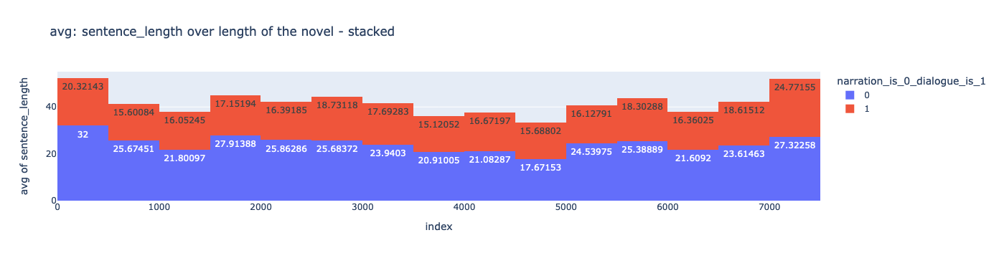

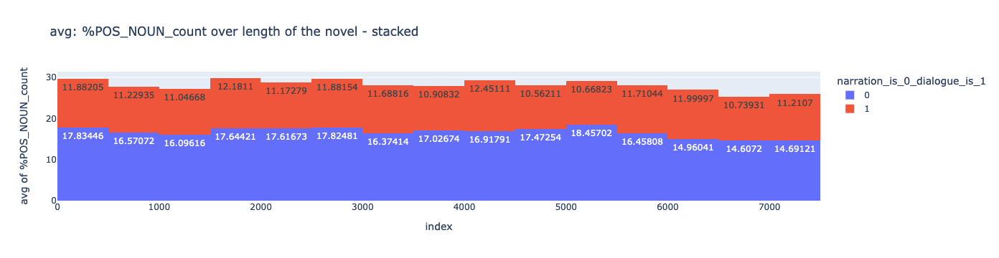

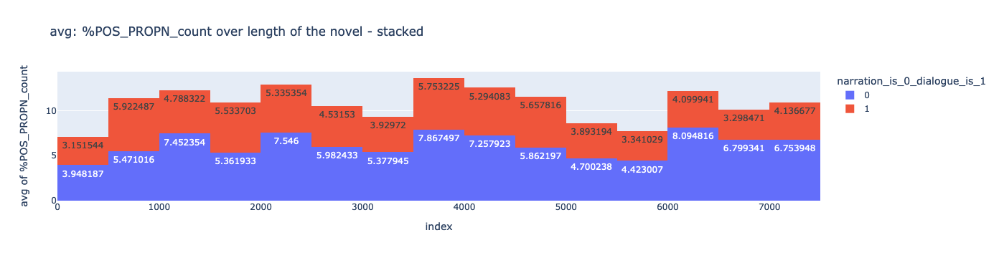

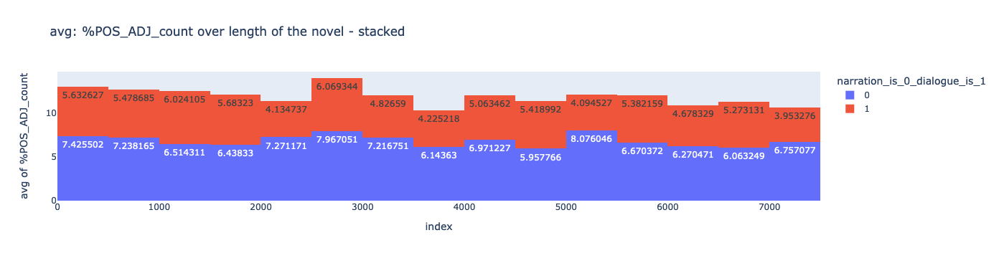

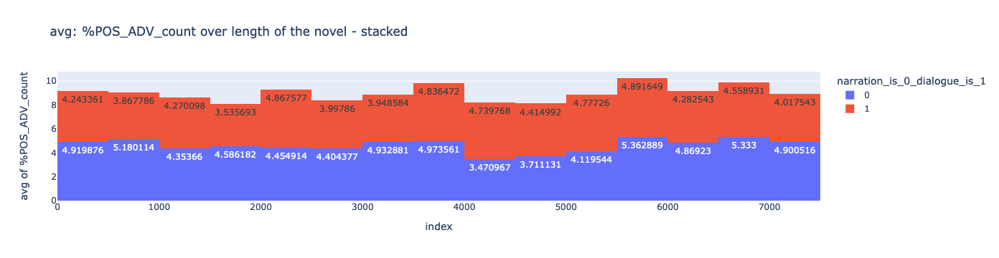

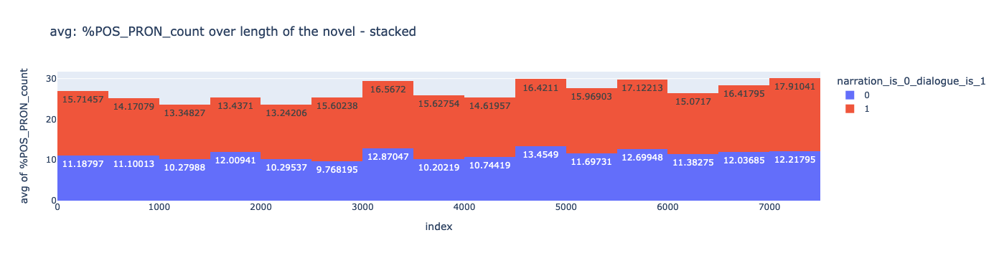

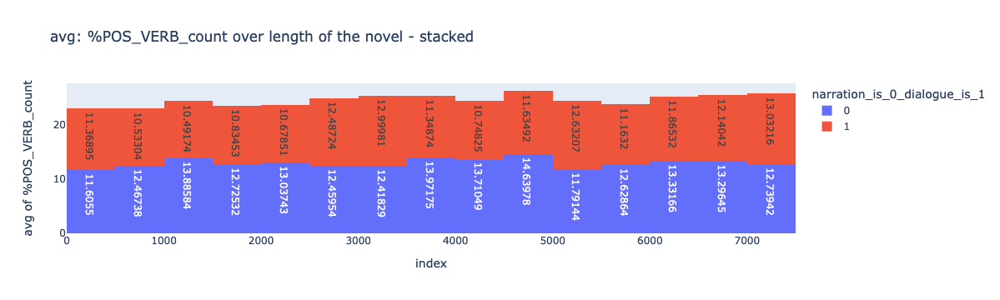

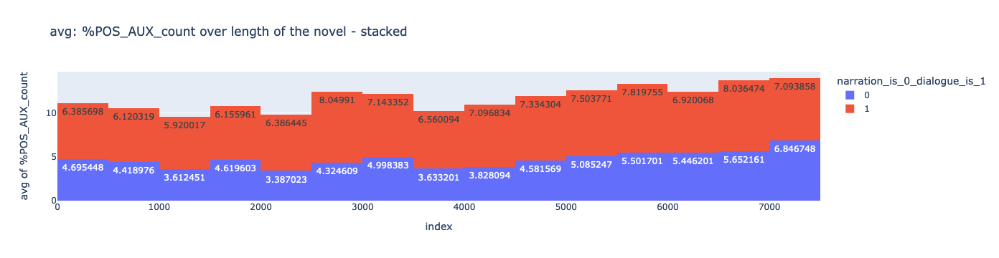

In [45]:
# for barmode in ["stack", "overlay", "group"]:
# for histfunc in ["avg","min","max"]:

# list_of_elements_to_analyze = ['%POS_NOUN_count', '%POS_DET_count', '%POS_ADP_count', '%POS_PROPN_count', '%POS_ADJ_count', '%POS_ADV_count', '%POS_PRON_count', '%POS_VERB_count', '%POS_AUX_count', 'sentence_length']
list_of_elements_to_analyze = ['sentence_length', '%POS_NOUN_count', '%POS_PROPN_count', '%POS_ADJ_count', '%POS_ADV_count', '%POS_PRON_count', '%POS_VERB_count', '%POS_AUX_count']

for element in list_of_elements_to_analyze:
    for histfunc in ["avg"]:
        fig = px.histogram(df, 
                           x=df.index,
                           nbins=30,
                           y=element,
                           color="narration_is_0_dialogue_is_1", 
                           barmode='stack',
                           histfunc=histfunc,
                           text_auto=True,
                           title=f"{histfunc}: {element} over length of the novel - stacked")
        fig.show()



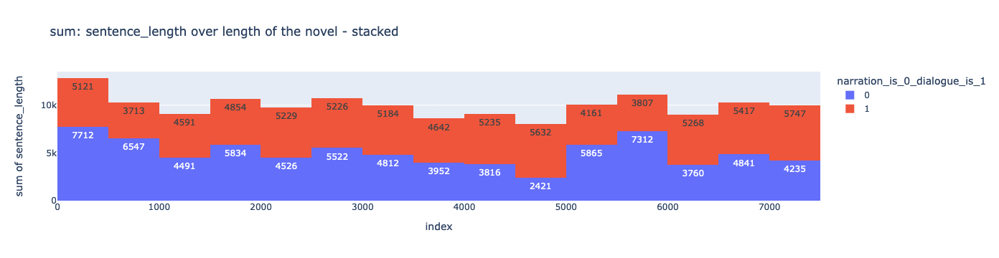

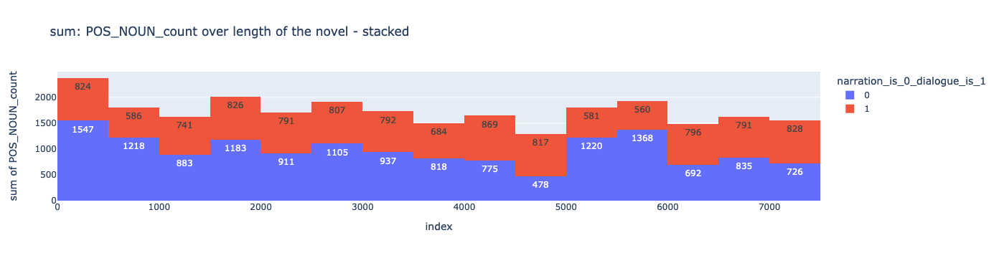

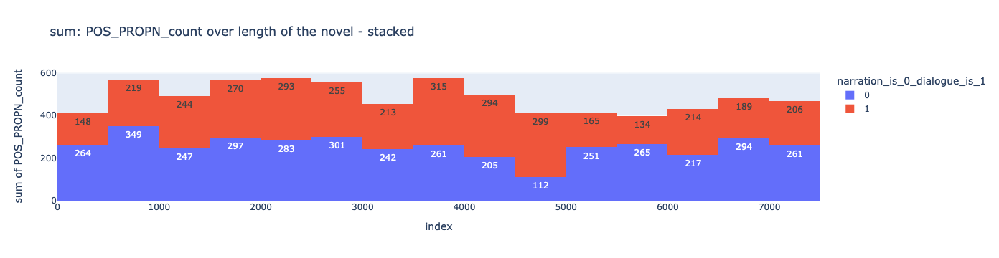

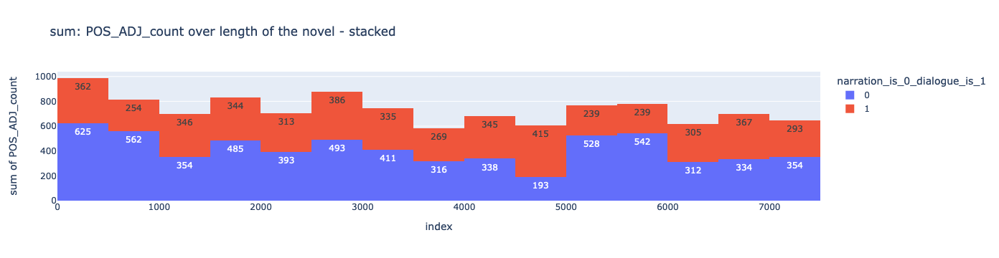

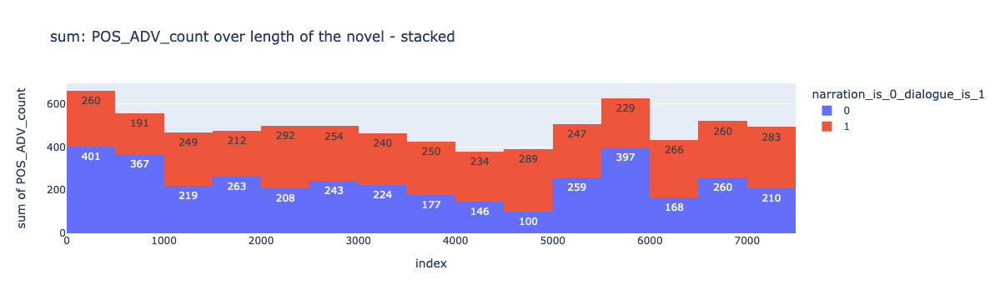

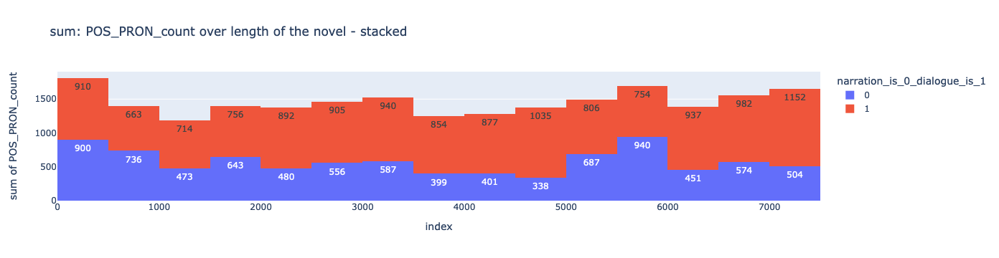

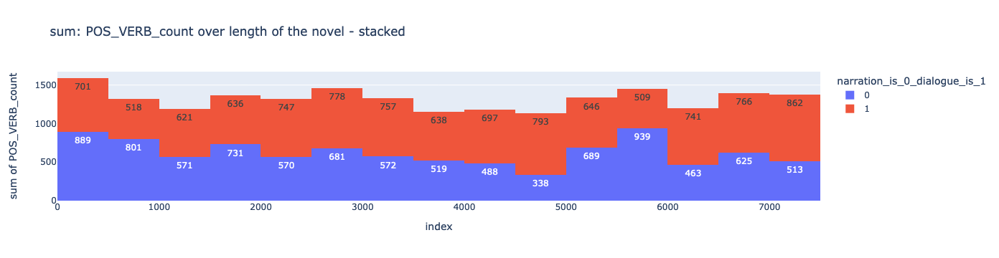

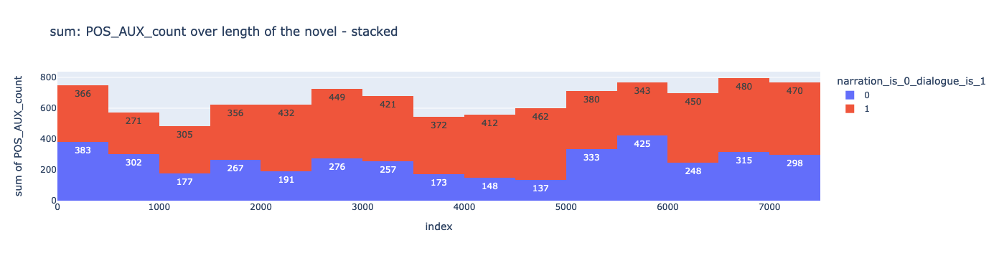

In [46]:
# for barmode in ["stack", "overlay", "group"]:
# for histfunc in ["avg","min","max"]:

# list_of_elements_to_analyze = ['%POS_NOUN_count', '%POS_DET_count', '%POS_ADP_count', '%POS_PROPN_count', '%POS_ADJ_count', '%POS_ADV_count', '%POS_PRON_count', '%POS_VERB_count', '%POS_AUX_count', 'sentence_length']
# list_of_elements_to_analyze = ['POS_NOUN_count', 'POS_PROPN_count', 'POS_ADJ_count', 'POS_ADV_count', 'POS_PRON_count', 'POS_VERB_count', 'POS_AUX_count', 'sentence_length']

for element in list_of_elements_to_analyze:
    element = element.strip('%')
    for histfunc in ["sum"]:
        fig = px.histogram(df, 
                           x=df.index,
                           nbins=30,
                           y=element,
                           color="narration_is_0_dialogue_is_1", 
                           barmode='stack',
                           histfunc=histfunc,
                           text_auto=True,
                           title=f"{histfunc}: {element} over length of the novel - stacked")
        fig.show()


In [62]:
df.loc[df['chapter_count'] == 'chapter_40',:]

,sentences,chapter_count,narration_is_0_dialogue_is_1,sentence_length,all_pos_counts,parts_of_speech_total_count,POS_PRON_count,POS_VERB_count,POS_ADP_count,POS_DET_count,POS_ADJ_count,POS_NOUN_count,POS_CCONJ_count,POS_PUNCT_count,POS_SCONJ_count,POS_ADV_count,POS_AUX_count,POS_PROPN_count,POS_NUM_count,POS_PART_count,POS_INTJ_count,POS_X_count,POS_SPACE_count,%POS_PRON_count,%POS_VERB_count,%POS_ADP_count,%POS_DET_count,%POS_ADJ_count,%POS_NOUN_count,%POS_CCONJ_count,%POS_PUNCT_count,%POS_SCONJ_count,%POS_ADV_count,%POS_AUX_count,%POS_PROPN_count,%POS_NUM_count,%POS_PART_count,%POS_INTJ_count,%POS_X_count,%POS_SPACE_count
7373,Two years have passed since the May twilight in which Robert found his old friend; and Mrprd Audley's dream of a fairy cottage has been realized between Teddington Locks and Hampton Bridge where amid a little forest of foliage there is a fantastical dwelling place of rustic woodwork whose latticed windows look out upon the river.,chapter_40,0,56,"[[NUM, 1], [NOUN, 12], [AUX, 3], [VERB, 6], [SCONJ, 3], [DET, 6], [PROPN, 8], [ADP, 7], [PRON, 3], [ADJ, 5], [PUNCT, 2], [CCONJ, 2], [PART, 1]]",59,3.0,6.0,7.0,6.0,5.0,12.0,2.0,2.0,3.0,0.0,3.0,8.0,1.0,1.0,0.0,0.0,0.0,5.085,10.169,11.864,10.169,8.475,20.339,3.390,3.390,5.085,0.000,5.085,13.559,1.695,1.695,0.0,0.000,0.0
7374,Here among the lilies and the rushes on the sloping bank a brave boy of eight years old plays with a toddling baby who peers wonderingly from his nurse's arms at that other baby in the purple depth of the quiet water.,chapter_40,0,42,"[[ADV, 2], [ADP, 8], [DET, 8], [NOUN, 11], [CCONJ, 1], [VERB, 4], [ADJ, 5], [NUM, 1], [PRON, 2], [PART, 1], [PUNCT, 1]]",44,2.0,4.0,8.0,8.0,5.0,11.0,1.0,1.0,0.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,4.545,9.091,18.182,18.182,11.364,25.000,2.273,2.273,0.000,4.545,0.000,0.000,2.273,2.273,0.0,0.000,0.0
7375,Mrprd Audley is a rising man upon the home circuit by this time and has distinguished himself in the great breach of promise case of Hobbs v. Nobbs and has convulsed the court by his deliciously comic rendering of the faithless Nobb's amatory correspondence.,chapter_40,0,44,"[[PROPN, 6], [AUX, 3], [DET, 6], [VERB, 3], [NOUN, 10], [SCONJ, 1], [ADP, 6], [CCONJ, 3], [PRON, 2], [ADJ, 3], [ADV, 1], [PART, 1], [PUNCT, 1]]",46,2.0,3.0,6.0,6.0,3.0,10.0,3.0,1.0,1.0,1.0,3.0,6.0,0.0,1.0,0.0,0.0,0.0,4.348,6.522,13.043,13.043,6.522,21.739,6.522,2.174,2.174,2.174,6.522,13.043,0.000,2.174,0.0,0.000,0.0
7376,The handsome darkeyed boy is Master George Talboys who declines musa at Eton and fishes for tadpoles in the clear water under the spreading umbrage beyond the ivied walls of the academy.,chapter_40,0,32,"[[DET, 5], [ADJ, 4], [NOUN, 8], [AUX, 1], [PROPN, 4], [PRON, 1], [VERB, 2], [ADP, 6], [CCONJ, 1], [PUNCT, 1]]",33,1.0,2.0,6.0,5.0,4.0,8.0,1.0,1.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,3.030,6.061,18.182,15.152,12.121,24.242,3.030,3.030,0.000,0.000,3.030,12.121,0.000,0.000,0.0,0.000,0.0
7377,But he comes very often to the fairy cottage to see his father who lives there with his sister and his sister's husband; and he is very happy with his Uncle Robert his Aunt Clara and the pretty baby who has just begun to toddle on the smooth lawn that slopes down to the water's brink upon which there is a little Swiss boathouse and landingstage where Robert and George moor their slender wherries.,chapter_40,0,74,"[[CCONJ, 6], [PRON, 13], [VERB, 8], [ADV, 5], [ADP, 6], [DET, 5], [NOUN, 13], [PART, 4], [PUNCT, 2], [AUX, 2], [ADJ, 6], [PROPN, 6], [SCONJ, 2]]",78,13.0,8.0,6.0,5.0,6.0,13.0,6.0,2.0,2.0,5.0,2.0,6.0,0.0,4.0,0.0,0.0,0.0,16.667,10.256,7.692,6.410,7.692,16.667,7.692,2.564,2.564,6.410,2.564,7.692,0.000,5.128,0.0,0.000,0.0
7378,Other people come to the cottage near Teddington.,chapter_40,0,8,"[[ADJ, 1], [NOUN, 2], [VERB, 1], [ADP, 2], [DET, 1], [PROPN, 1], [PUNCT, 1]]",9,0.0,1.0,2.0,1.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000,11.111,22.222,11.111,11.111,22.222,0.000,11.111,0.000,0.000,0.000,11.111,0.000,0.000,0.0,0.000,0.0

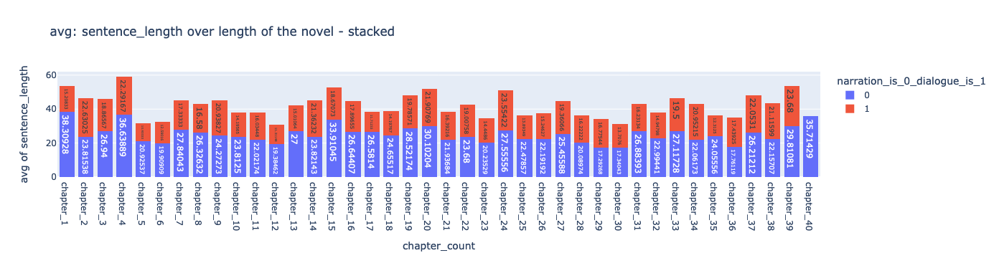

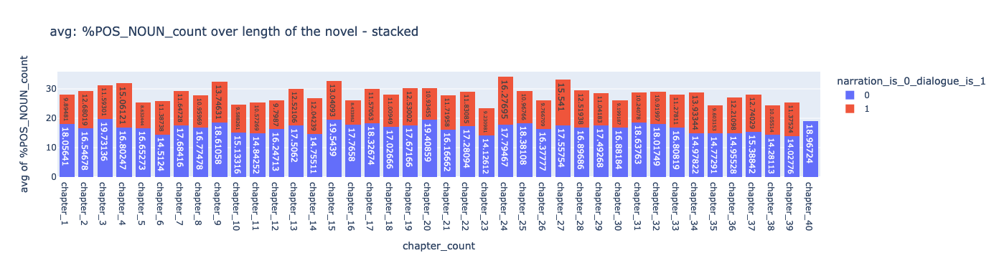

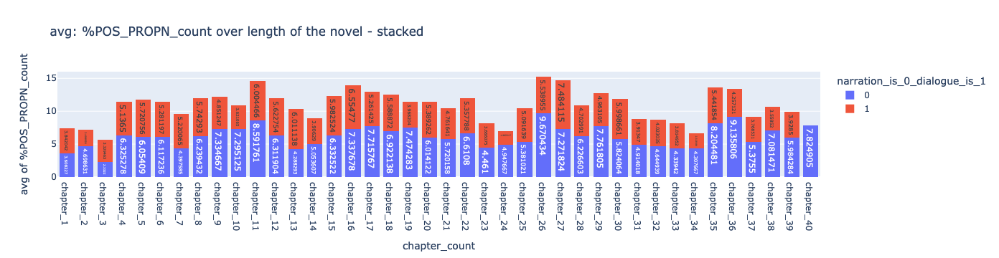

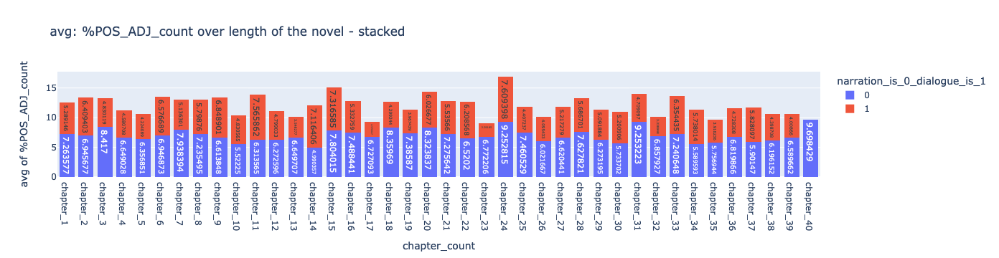

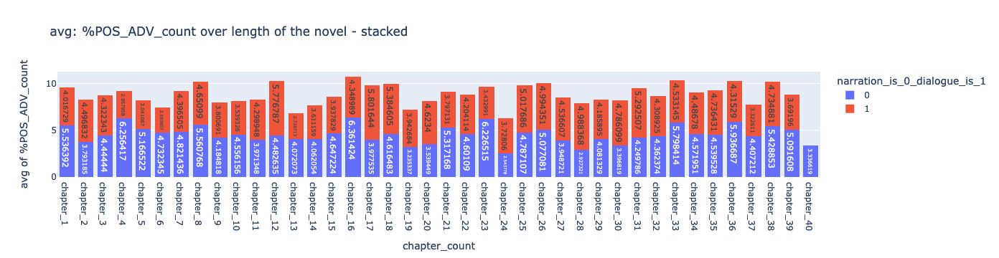

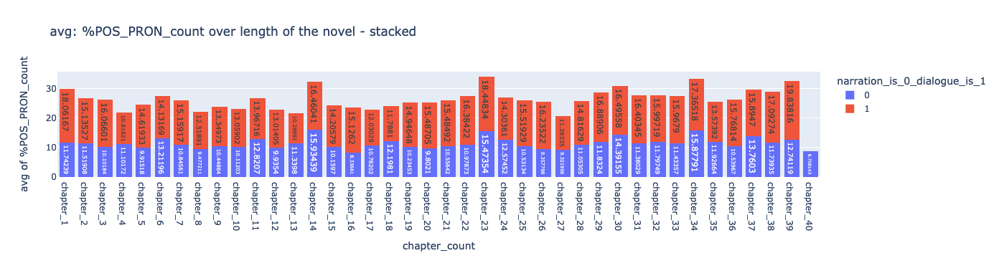

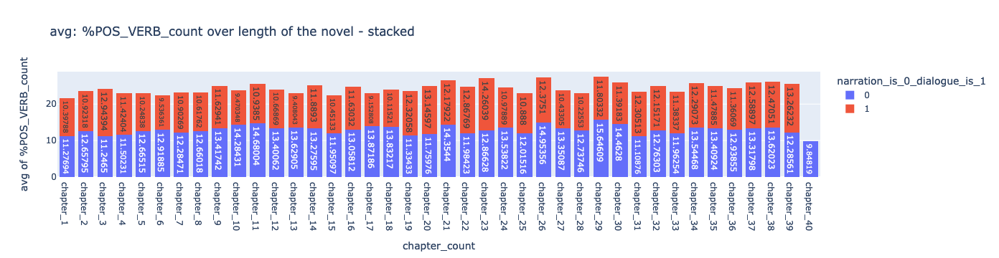

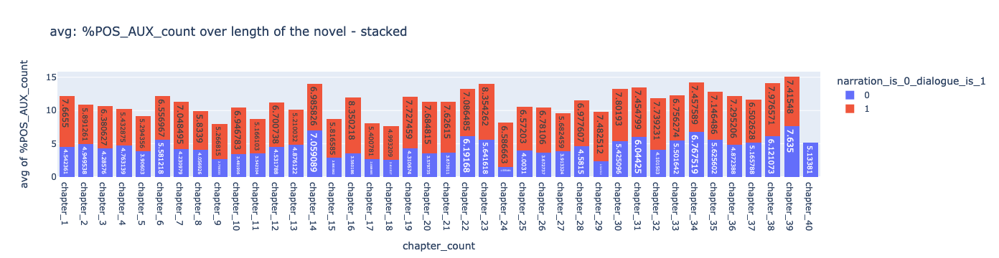

In [61]:

for element in list_of_elements_to_analyze:
    # element = element.strip('%')
    for histfunc in ["avg"]:
        fig = px.histogram(df, 
                           x=df.chapter_count,
                           nbins=30,
                           y=element,
                           color="narration_is_0_dialogue_is_1", 
                           barmode='stack',
                           histfunc=histfunc,
                           text_auto=True,
                           title=f"{histfunc}: {element} over length of the novel - stacked")
        fig.show()

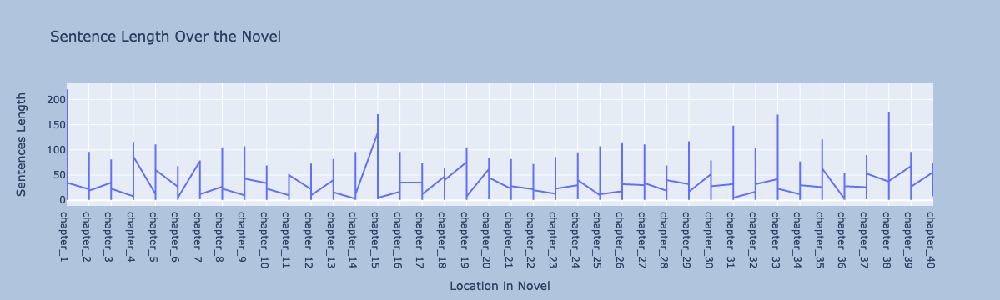

In [49]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x= df.chapter_count,
    y= df["sentence_length"]
))
fig.update_layout(
    title="Sentence Length Over the Novel",
    xaxis_title="Location in Novel",
    yaxis_title="Sentences Length",
    autosize=True,
    paper_bgcolor="LightSteelBlue",
)
fig.show()

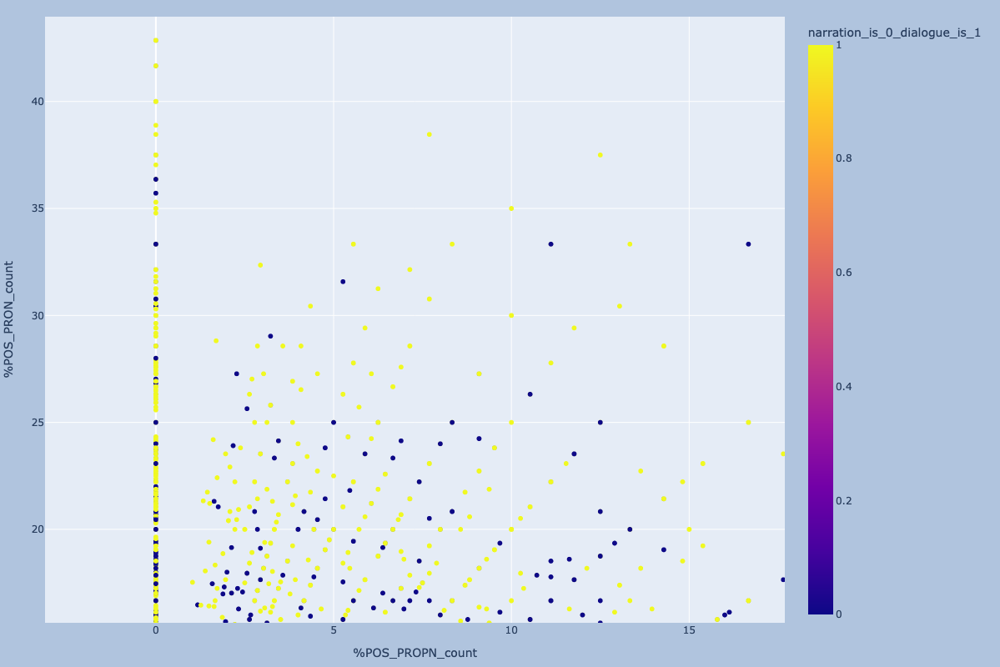

In [59]:
# https://plotly.com/python-api-reference/generated/plotly.express.scatter
fig = px.scatter(df, x="%POS_PROPN_count", y="%POS_PRON_count", color="narration_is_0_dialogue_is_1",
                 width=1600, height=800)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [43]:
### FUNCTIONS 6/6

## Functions that 1) save just metadata, 2) save the full dataframe, 3) load the dataframe

# for metadata output:
def output_metadata(df, spreadsheet_name='FILL_IN_SPREADSHEET_NAME_META', path_to_spreadsheets=path_to_spreadsheets):
    # setting up list of columns NOT to export (since this is just metadata)
    list_of_columns_not_to_include = ['words_standardized_stopped', 'sentences_standardized_stopless','words_as_string_for_vectorizor', 'dirty_text', 'sentences']
    # all other columns are included
    columns_to_include = [column_name for column_name in df.columns.values.tolist() if column_name.lower() not in list_of_columns_not_to_include]
    df_meta = df[columns_to_include]
    df_meta.to_csv(path_to_spreadsheets + spreadsheet_name + '.csv')
    print(spreadsheet_name + ' was saved in '+str(path_to_spreadsheets))
    
# for full output:
def output_full(df, spreadsheet_name='FILL_IN_SPREADSHEET_NAME_FULL', path_to_spreadsheets=path_to_spreadsheets):
    df.to_csv(path_to_spreadsheets + spreadsheet_name + '.csv')
    print(spreadsheet_name + ' was saved in '+str(path_to_spreadsheets))

# load a dataframe
def open_df_and_print(file_name='df_full.csv', path_to_spreadsheets=path_to_spreadsheets, drop_first_column=False):
    df = pd.read_csv(path_to_spreadsheets + file_name, engine='python')
    if drop_first_column == True:
        df.drop(df.columns[0], axis=1, inplace=True)
    return df
    


In [44]:
output_full(df, spreadsheet_name=f'df_{novel_name}_full', path_to_spreadsheets=path_to_spreadsheets+'/individual_novels/')
output_metadata(df, spreadsheet_name=f'df_{novel_name}_meta', path_to_spreadsheets=path_to_spreadsheets+'/individual_novels/')

df_Lady_Audleys_Secret_ed3_full was saved in ../../data/spreadsheets//individual_novels/
df_Lady_Audleys_Secret_ed3_meta was saved in ../../data/spreadsheets//individual_novels/
